## Analyse mouse brain cut for Xenium-benchmark analysis

This notebook produces 3d plots of overlapping mRNA signal in the central ('2') msBrain slide of our Xenium-benchmark data sets.
Cell types are modeled using the SSAM algorithm and 

In [131]:
from IPython.display import display, HTML
display(HTML("<style>.container { width:95% !important; }</style>"))


#### imports 

In [2]:
import os
from collections import defaultdict

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn import preprocessing

import ssam

import zarr

#### parameters

In [3]:

# global parameters
um_per_pixel = 2.5
ncores = 10 # Number of cores used for kernel density estimation

# SSAM algorithm parameters
bw=1 # this should be set according to molecule density. 2-4 is a good range to explore.

# local max params
local_max_min_expression=0.027 # this doesnt seem to change when bw is set to 2.5
local_max_min_norm=0.1 # this should be investigated and set. No guidelines right now. def 0.2.
local_max_search_size=3 # not sure of effect
local_max_ext="exp"+str(local_max_min_expression)+"norm"+str(local_max_min_norm)

# clustering
clust_vec_min_cluster_size=0 # can be increased for only robest types... or reduced for rare
clust_vec_pca_dims=60 # perhaps this should be set to the tSNE and UMAP components?
clust_vec_resolution=0.1 # this is the Louvain resolution. Higher means fewer clusters.
clust_vec_metric='correlation'
clust_vec_ext="minsize"+str(clust_vec_min_cluster_size)+"pca"+str(clust_vec_pca_dims)+"res"+str(clust_vec_resolution)

# # UMAP/tSNE params
# num_p_componants=22 # used for tSNE and UMAP. Harmonise with clust_vec_pca_dims?
# tsne_s=10 # size of spots in scatter plot
# tsne_ext="pca"+str(num_p_componants)+"s"+str(tsne_s)
# umap_ext="pca"+str(num_p_componants)

# cell type map filtering
filter_method = "local"
filter_params = {
    "block_size": 151,
    "method": "mean",
    "mode": "constant",
    "offset": 0.1
}
filter_cmap_min_r=0.6 # minimum correlation to be considered for annotation
filter_cmap_min_blob_area=50 # minimum size of annotated area to filter small local noise
cmap_ext="minR"+str(filter_cmap_min_r)+"minBlob"+str(filter_cmap_min_blob_area)

# # domain params
# domains_step=10
# domain_radius=50
# domain_n_clusters=20
# domain_merge_remote=True
# domain_merge_thres=0.7
# domain_local_norm_thresh=1500
# domain_extension="step"+str(domains_step)+"rad"+str(domain_radius)+"nclus"+str(domain_n_clusters)+"merge"+str(domain_merge_remote)+str(domain_merge_thres)+"norm"+str(domain_local_max_min_norm)



#### define data 

In [4]:
data_root = '../../data/'
output_root = '../../output'
project_subfolder = 'xenium_prerelease_jun20_mBrain_replicates_update_Sept_25/mBrain_ff_rep1'

# '/dh-projects/ag-ishaque/analysis/tiesmeys/xenium-benchmark/\
# data/xenium_prerelease_jun20_mBrain_replicates_update_Sept_25/mBrain_ff_rep1'

# coordinate_file = os.path.join(data_root,project_subfolder,'transcripts.csv')

# # create output folder:
# os.makedirs(os.path.join(output_root,project_subfolder),exist_ok=True)

import anndata

adata = anndata.read_h5ad('../../data/mBrain/ms_brain_rep2.h5ad','r')


In [5]:
# dapi_img = plt.imread(os.path.join('./morphology_mip.ome.jpg')).T

In [6]:

adata.uns['spots']

,cell_id,overlaps_nucleus,feature_name,x_location,y_location,z_location,qv
transcript_id,,,,,,,
281496451547136,5335,1,Dkk3,108.882760,1191.4623,15.111133,14.470180
281496451547137,4908,1,Neurod6,599.608800,1214.9828,13.810570,17.666338
281496451547138,7469,1,Ipcef1,40.342777,1966.5145,14.667373,9.514981
281496451547139,7485,1,Bhlhe40,34.722248,2017.1637,15.058671,13.275211
281496451547140,4905,1,Car4,623.589000,1048.9484,15.842804,29.903952
...,...,...,...,...,...,...,...
281513631904696,28317,1,Cdh13,2738.748300,1722.5444,28.736680,14.214149
281513631904697,28334,1,Fign,2618.527000,1743.7420,29.148848,40.000000
281513631904698,2563,1,Zfp536,2907.959700,1812.5348,28.413157,15.674445


#### import cell segmentation data

In [7]:
import PIL.ImageDraw as ImageDraw
import PIL.Image as Image



import zarr

zarr_file = zarr.open('../../data/xenium_prerelease_jun20_mBrain_replicates/mBrain_ff_rep2/cell_segmentation_dataset.zarr.zip',mode='r')
# list(zarr_file.keys())


# cell_polygons = zarr_file['polygon_vertices']
# cell_segment_image = Image.new("RGBA", (np.ceil(cell_polygons[:,:,::2].max()).astype(int),np.ceil(cell_polygons[:,:,1::2].max()).astype(int)),color=(0,0,0,0))
# draw = ImageDraw.Draw(cell_segment_image)

# for i in range(cell_polygons.shape[1]):
#     draw.polygon((cell_polygons[0,i].reshape((-1,2))),outline='royalblue')
#     draw.polygon((cell_polygons[1,i].reshape((-1,2))),outline='white')


In [8]:
list(zarr_file.keys())

cell_segmentation_mask = np.array(zarr_file['masks'][1])

In [9]:
cell_annotatons = pd.read_csv('../../data/mBrain/mousebrain_rep2.csv',index_col=0)
cell_annotatons

,index,cell_id,x_centroid,y_centroid,transcript_counts,control_probe_counts,control_codeword_counts,total_counts,cell_area,nucleus_area,...,leiden_0_8,leiden_0_6,Class,initial_annotation,celltype_annotation,cell_code,X,Y,X_umap,Y_umap
26372,0,1,178.828415,24.717344,138,0,0,138.0,418.056562,40.098750,...,8,7,Excitatory,29_L6B_ctx,L6B_ctx,1_2,841.545061,116.316856,2.924479,3.485298
26373,1,2,186.253006,8.458055,38,0,0,38.0,245.920938,10.115000,...,6,2,Astro,10_Astro,Astro,2_2,876.484296,39.802590,4.213676,-4.044210
26374,2,3,202.143433,6.923799,19,0,0,19.0,280.510625,13.501719,...,6,2,Astro,10_Astro,Astro,3_2,951.262737,32.582565,4.502540,-3.781241
26375,3,4,199.003693,26.451843,139,0,0,139.0,483.487969,40.189062,...,6,2,Astro,10_Astro,Astro,4_2,936.487497,124.479200,3.301719,-3.376107
26376,4,5,224.139435,10.844007,79,0,0,79.0,495.544688,34.725156,...,6,2,Astro,10_Astro,Astro,5_2,1054.773284,51.030593,3.769324,-3.679125
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56458,30086,30087,2674.850830,3443.191895,227,0,0,227.0,246.282187,37.976406,...,8,7,Excitatory,6_L6 CT CTX,L6 CT CTX,30087_2,12587.527024,16203.247873,3.552261,4.716935
56459,30087,30088,2661.366699,3478.147461,271,0,0,271.0,245.695156,49.762188,...,8,7,Excitatory,6_L6 CT CTX,L6 CT CTX,30088_2,12524.072323,16367.744573,3.793444,5.188894
56460,30088,30089,2678.595703,3454.411133,194,0,0,194.0,160.711094,26.371250,...,15,13,Microglia,15_Microglia,Microglia,30089_2,12605.149947,16256.044262,1.902864,-0.181710
56461,30089,30090,2683.478516,3409.250488,234,0,0,234.0,319.345000,27.274375,...,8,7,Excitatory,6_L6 CT CTX,L6 CT CTX,30090_2,12628.127877,16043.523688,3.593165,4.262542


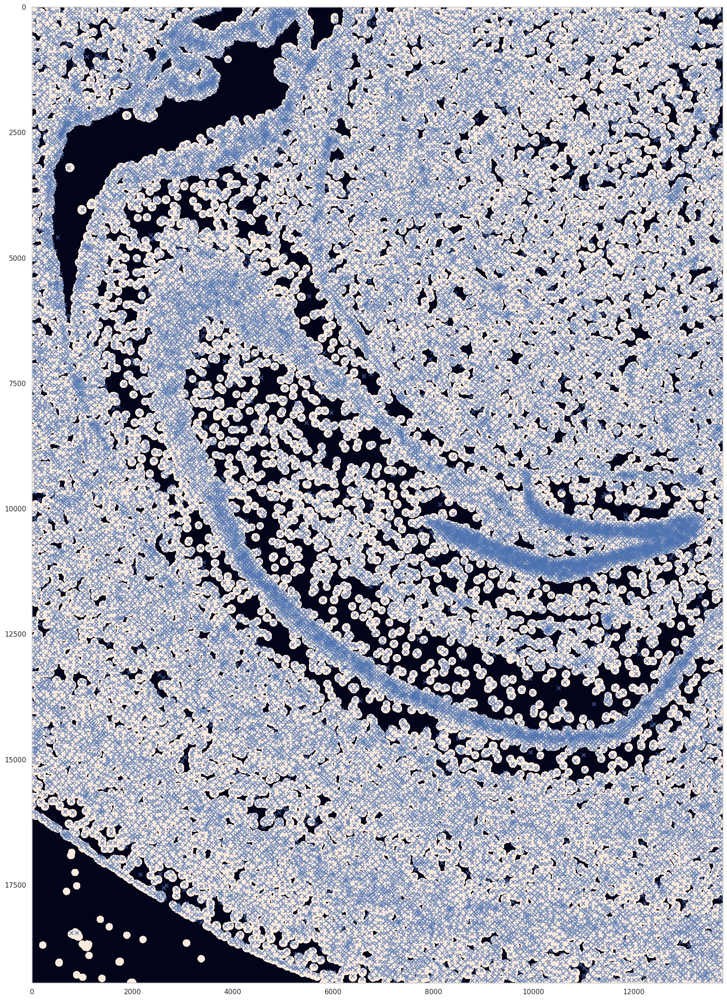

In [10]:
plt.figure(figsize=(20,30))

plt.imshow(cell_segmentation_mask>0,interpolation='none')

plt.scatter(*np.array(cell_annotatons[['x_centroid','y_centroid']]).T*4.7,marker='x',alpha=0.8)

#### import/pre-process data

In [11]:
df = pd.DataFrame(adata.uns['spots'].loc[:,['x_location', 'y_location','z_location','feature_name']])#read_csvcoordinate_file,usecols=['x_location', 'y_location', 'feature_name'])

df = df[~df.feature_name.str.contains('DUMMY')]
df['feature_name'] = df.feature_name.astype('category')



In [12]:
from sklearn.neighbors import NearestNeighbors

knn = NearestNeighbors(n_neighbors=40).fit(df[['x_location','y_location']])
dists,nbrs = knn.kneighbors(df[['x_location','y_location']])

In [13]:
# (np.abs((df.z_location).to_numpy()-zs.flatten())>4).mean()

In [14]:
zs = np.array(df[['z_location']])

for i in range(30):
    zs = zs[nbrs].mean(1)

<IPython.core.display.Javascript object>


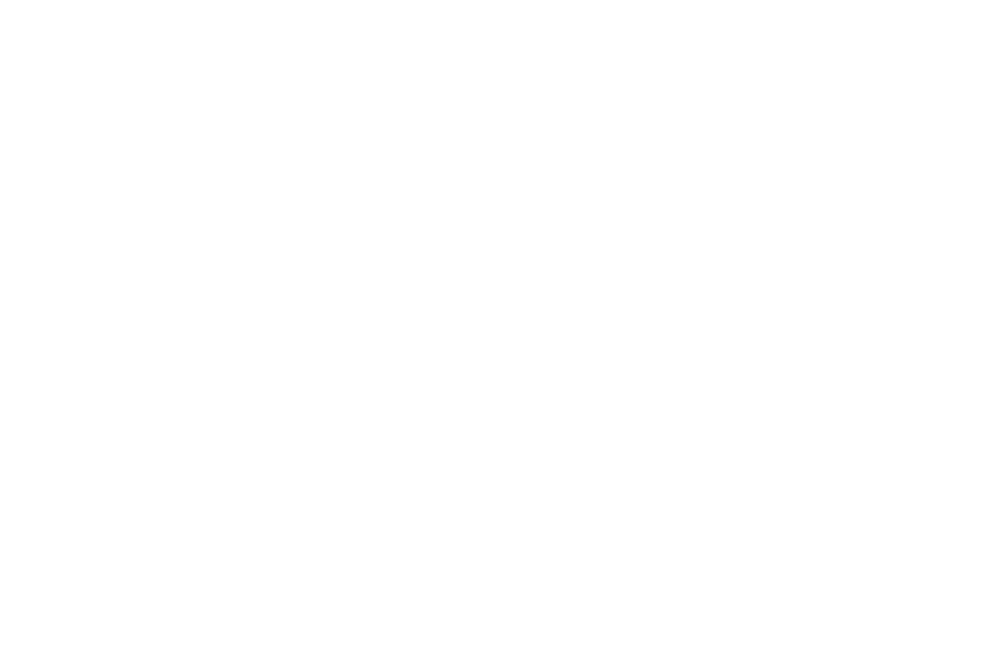

(-7.0, 7.0)

In [15]:
%matplotlib notebook

xlims = [440,570]
ylims = [410,540]

df_ = df.iloc[::100]

fig = plt.figure(figsize=(15,10))
ax = fig.add_subplot(projection='3d')

z_location = (df_.z_location).to_numpy()-zs.flatten()[::100]

ax.scatter(df_.x_location,df_.y_location,z_location, c=(z_location),cmap='jet')
plt.tight_layout()

ax.set_zlim(-7,7)

In [16]:
mask = np.abs((df.z_location).to_numpy()-zs.flatten())<4
df = df[mask]

df['x_location']=(df.x_location-df.x_location.min())/um_per_pixel+5
df['y_location']=(df.y_location-df.y_location.min())/um_per_pixel+5
df['z_location']=((df.z_location).to_numpy()-zs.flatten()[mask])/um_per_pixel+4

# df['z_location']-=(df.y_location/500+df.x_location/400)
# df['z_location']=(df.z_location-df.z_location.min())/um_per_pixel+3

pos_dic = defaultdict(lambda: [])

xmin,xmax = df.x_location.min(), df.x_location.max()+5
ymin,ymax = df.y_location.min(), df.y_location.max()+5
zmin,zmax = df.z_location.min(), df.z_location.max()+1

width = np.ceil(xmax+xmin).astype(int)
height = np.ceil(ymax+ymin).astype(int)
depth = np.ceil(zmax+zmin).astype(int)

<IPython.core.display.Javascript object>


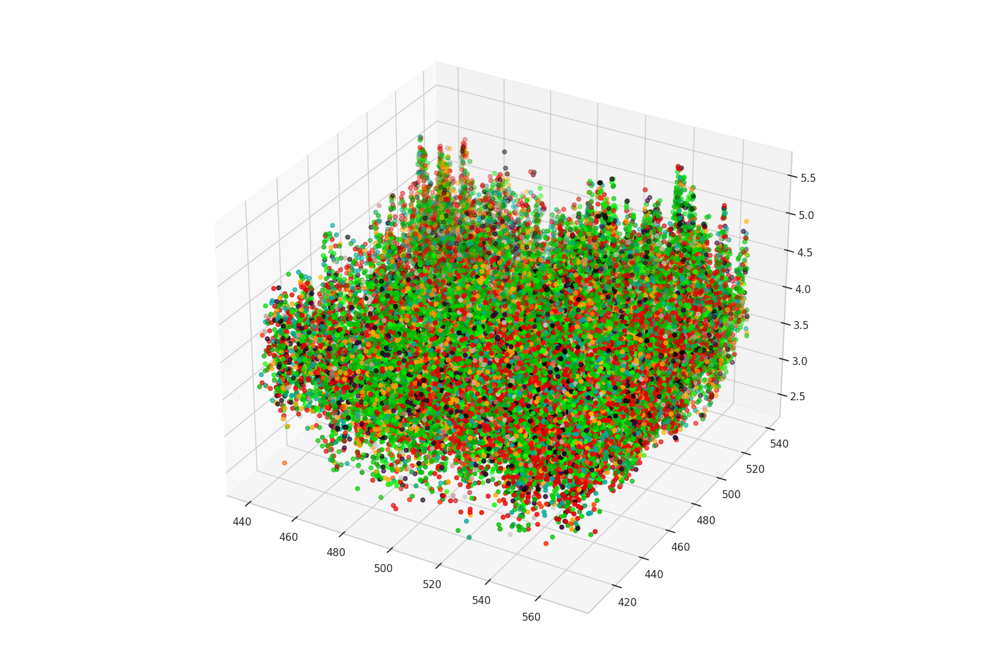

In [102]:
%matplotlib notebook

xlims = [440,570]
ylims = [410,540]

df_ = df[(df.x_location>xlims[0])&(df.x_location<xlims[1])&(df.y_location>ylims[0])&(df.y_location<ylims[1])]

fig = plt.figure(figsize=(15,10))
ax = fig.add_subplot(projection='3d')

ax.scatter(df_.x_location,df_.y_location,df_.z_location, c=df_.feature_name.cat.codes,cmap='nipy_spectral')
plt.tight_layout()

# ax.set_zlim(5,7)

<IPython.core.display.Javascript object>


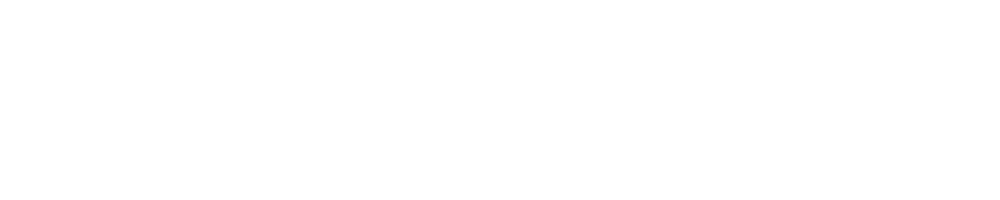

In [18]:
plt.figure(figsize=(25,5))

plt.scatter(df.y_location[::400],df.z_location[::400],c=df.x_location[::400],alpha=0.1)

plt.xlabel('x')
plt.ylabel('z')

plt.colorbar()

In [19]:
signature_path = '/dh-projects/ag-ishaque/analysis/tiesmeys/xenium-benchmark/data/mBrain/mean_expression-20221009T190945Z-001/mean_expression/mean_expression_Yao_150kcells_384_ref_cluster_label.csv'

signatures = pd.read_csv(signature_path,
                         index_col=0).T

signatures

unique_genes = df.feature_name.unique()
gene_intersection = signatures.index[signatures.index.isin(unique_genes)]

signatures = signatures.loc[signatures.index.isin(gene_intersection)]
signatures = signatures.sort_index()

df = df[df.feature_name.isin(gene_intersection)]

signatures = signatures.loc[gene_intersection]
# sdata = sdata[sdata.g.isin(gene_intersection)]

# sdata = sdata.clean()
df_with_edge_cases = df.copy()
df_with_edge_cases.to_csv("../../output/xenium_prerelease_jun20_mBrain_replicates/mBrain_ff_rep/edge_cases.csv")
df_with_edge_cases['edge_cases']=0
df_with_edge_cases['edge_case_cell_id']=0

In [20]:
# signatures_normalized = preprocessing.normalize(signatures,axis=0)
# signatures_normalized = preprocessing.normalize(signatures_normalized,axis=1)#np.nan_to_num(signatures/signatures.sum(0))

In [21]:
for gene in signatures.index:
    pos_dic[gene]=np.array(df[df.feature_name==gene][['x_location','y_location','z_location']])

In [22]:
all_genes = list(signatures.index)
ds = ssam.SSAMDataset(all_genes, [pos_dic[gene] for gene in all_genes], width, height,depth)

In [23]:
analysis = ssam.SSAMAnalysis(ds, ncores=ncores, verbose=True,)# save_dir = "./../../output/xenium_prerelease_jun20_mBrain_replicates/mBrain_ff_rep/ssam-temp")

analysis.run_fast_kde(bandwidth=bw, use_mmap=False,re_run=True)

Processing gene Slc17a7...
Processing gene Nrn1...
Processing gene Epha4...
Processing gene Serpine2...
Processing gene Gfap...
Processing gene Clmn...
Processing gene 2010300C02Rik...
Processing gene Neurod6...
Processing gene Dner...
Processing gene Tubb2a...
Processing gene Cabp7...
Processing gene Dpy19l1...
Processing gene Cpne6...
Processing gene Id2...
Processing gene Dkk3...
Processing gene Cux1...
Processing gene Kctd12...
Processing gene Acsbg1...
Processing gene Rorb...
Processing gene Garnl3...
Processing gene Cpne4...
Processing gene Calb1...
Processing gene Ntsr2...
Processing gene Nrep...
Processing gene Gjc3...
Processing gene Arhgap12...
Processing gene Rmst...
Processing gene Car4...
Processing gene Gng12...
Processing gene Gad1...
Processing gene Bhlhe40...
Processing gene Aqp4...
Processing gene Rims3...
Processing gene Necab1...
Processing gene Igfbp5...
Processing gene Dnajc21...
Processing gene Rasgef1b...
Processing gene Arc...
Processing gene Slc39a12...
Proces

In [24]:
sorted(df.feature_name.unique())# knn1 = NearestNeighbors(n_neighbors=20).fit(df[])

['2010300C02Rik',
 'Acsbg1',
 'Acta2',
 'Acvrl1',
 'Adamts2',
 'Adamtsl1',
 'Adgrl4',
 'Aldh1a2',
 'Aldh1l1',
 'Angpt1',
 'Ano1',
 'Aqp4',
 'Arc',
 'Arhgap12',
 'Arhgap25',
 'Arhgap6',
 'Arhgef28',
 'Atp2b4',
 'Bcl11b',
 'Bdnf',
 'Bhlhe22',
 'Bhlhe40',
 'Btbd11',
 'Cabp7',
 'Cacna2d2',
 'Calb1',
 'Calb2',
 'Car4',
 'Carmn',
 'Cbln1',
 'Cbln4',
 'Ccl3',
 'Cd14',
 'Cd24a',
 'Cd300c2',
 'Cd44',
 'Cd53',
 'Cd68',
 'Cd86',
 'Cd93',
 'Cdh13',
 'Cdh20',
 'Cdh4',
 'Cdh6',
 'Cdh9',
 'Chat',
 'Chodl',
 'Chrm2',
 'Chst9',
 'Cldn5',
 'Clmn',
 'Cntn6',
 'Cntnap4',
 'Cntnap5b',
 'Cntnap5c',
 'Cobll1',
 'Col19a1',
 'Col1a1',
 'Col6a1',
 'Cort',
 'Cpa6',
 'Cplx3',
 'Cpne4',
 'Cpne6',
 'Cpne8',
 'Crh',
 'Cspg4',
 'Cux1',
 'Cux2',
 'Cwh43',
 'Cyp1b1',
 'Dcn',
 'Dcx',
 'Deptor',
 'Dkk2',
 'Dkk3',
 'Dnajc21',
 'Dner',
 'Dpy19l1',
 'Dpyd',
 'Ebf3',
 'Emcn',
 'Epha4',
 'Etv5',
 'Eya4',
 'Fcrls',
 'Fezf2',
 'Fgd5',
 'Fhod3',
 'Fibcd1',
 'Fign',
 'Fmod',
 'Fn1',
 'Fos',
 'Foxp2',
 'Fstl4',
 'Gad1',
 'Gad2',
 

<IPython.core.display.Javascript object>


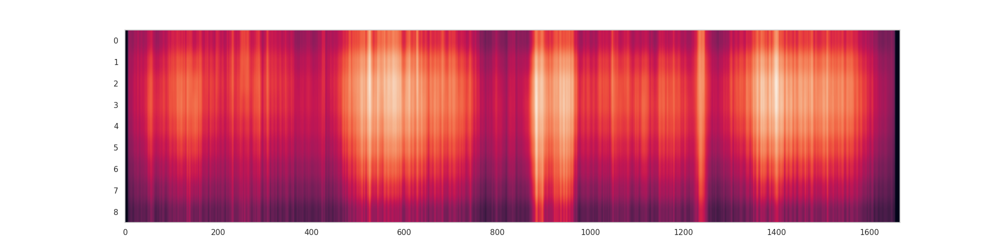

In [103]:
plt.figure(figsize=(20,5))

plt.imshow((ds.vf_norm.sum(0)).T,aspect='auto')


In [27]:
ds.vf*=(np.exp(np.linspace(-2.5,2.5,9)**2))[None,None,:,None]

In [28]:
ds.vf_norm[:]=ds.vf.sum(-1)

In [29]:
vf_bottom = ds.vf[:,:,:4,:].mean(2)
vf_top = ds.vf[:,:,5:,:].mean(2)

In [30]:
vf_bottom-=vf_bottom.mean(-1)[:,:,None]
vf_top-=vf_top.mean(-1)[:,:,None]

corrs = np.nan_to_num((vf_top*vf_bottom).mean(-1)/(vf_top.std(-1)*vf_bottom.std(-1)))

# corrs = (vf_top*vf_bottom).sum(-1)/(vf_top.sum(-1)**2*vf_bottom.sum(-1)**2)**0.5


/tmp/ipykernel_1001542/1203656150.py:4: RuntimeWarning: invalid value encountered in true_divide
  corrs = np.nan_to_num((vf_top*vf_bottom).mean(-1)/(vf_top.std(-1)*vf_bottom.std(-1)))


In [31]:
localmax_min_norm = 0.14
localmax_min_expression = 0.08
localmax_search_size = 5


analysis.find_localmax(search_size=localmax_search_size, min_norm=localmax_min_norm, min_expression=localmax_min_expression)

analysis.normalize_vectors()

Found 37471 local max vectors.


<IPython.core.display.Javascript object>


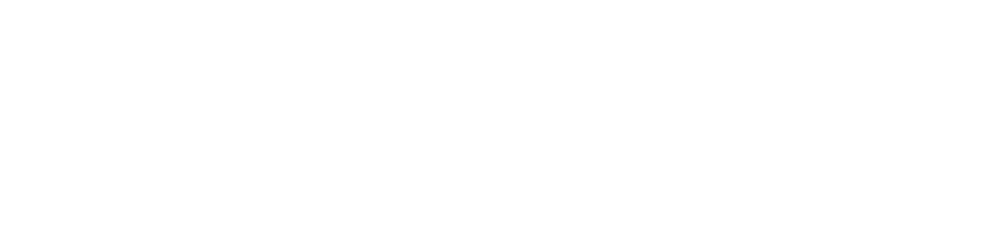

In [34]:
plt.figure(figsize=(20,5))
plt.imshow(ds.vf_norm[900,:].T,aspect='auto')

In [35]:
# clustering
clust_vec_min_cluster_size=15 # can be increased for only robest types... or reduced for rare
clust_vec_pca_dims=60 # perhaps this should be set to the tSNE and UMAP components?
clust_vec_resolution=0.2 # this is the Louvain resolution. Higher means fewer clusters.
clust_vec_metric='correlation'
clust_vec_ext="minsize"+str(clust_vec_min_cluster_size)+"pca"+str(clust_vec_pca_dims)+"res"+str(clust_vec_resolution)


analysis.cluster_vectors(
    min_cluster_size=clust_vec_min_cluster_size,
    pca_dims=clust_vec_pca_dims,
    resolution=clust_vec_resolution,
    metric=clust_vec_metric)

Found 52 clusters


In [36]:
# vf_bottom-=vf_bottom.mean(-1)[:,:,None]
# vf_top-=vf_top.mean(-1)[:,:,None]

# corrs = np.nan_to_num((vf_top*vf_bottom).sum(-1)/((vf_top**2).sum(-1) * (vf_bottom**2).sum(-1))**0.5)

# corrs[corrs>1]=1  #there seem to be overflow effects in the tissue-free 'empty space' that causes corr values > 1



In [37]:
xlim,ylim = plt.gca().get_xlim(),plt.gca().get_ylim()

In [38]:
# dimred via PCA
from sklearn.decomposition import PCA

pca = PCA(n_components=20)
facs = pca.fit_transform(ds.normalized_vectors[ds.filtered_cluster_labels != -1])

In [39]:
#create a umap for x/y, color

from umap import UMAP

umap = UMAP(n_neighbors=70,min_dist=0.4)
umap_coords = umap.fit_transform(facs,)



cumap = UMAP(n_components=3,n_neighbors=70,min_dist=0.1)
cumap_coords = cumap.fit_transform(facs,)

In [40]:
# scale to float rgb
cumap_coords_scaled = cumap_coords-cumap_coords.min(0)#[:,None]
cumap_coords_scaled /= cumap_coords_scaled.max(0)#[:,None]


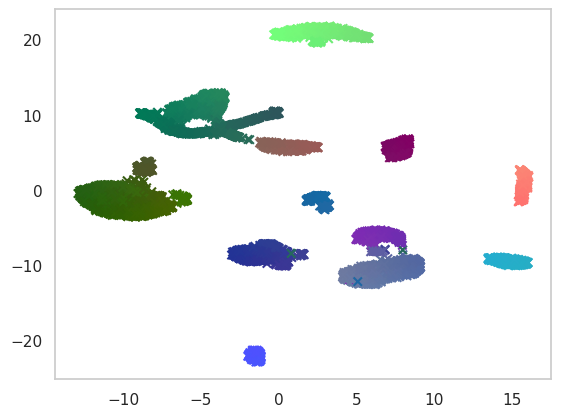

In [41]:
%matplotlib inline
plt.scatter(*umap_coords.T,marker='x',c=cumap_coords_scaled)#ds.cluster_labels[ds.filtered_cluster_labels != -1],cmap='nipy_spectral',alpha=1)

<IPython.core.display.Javascript object>


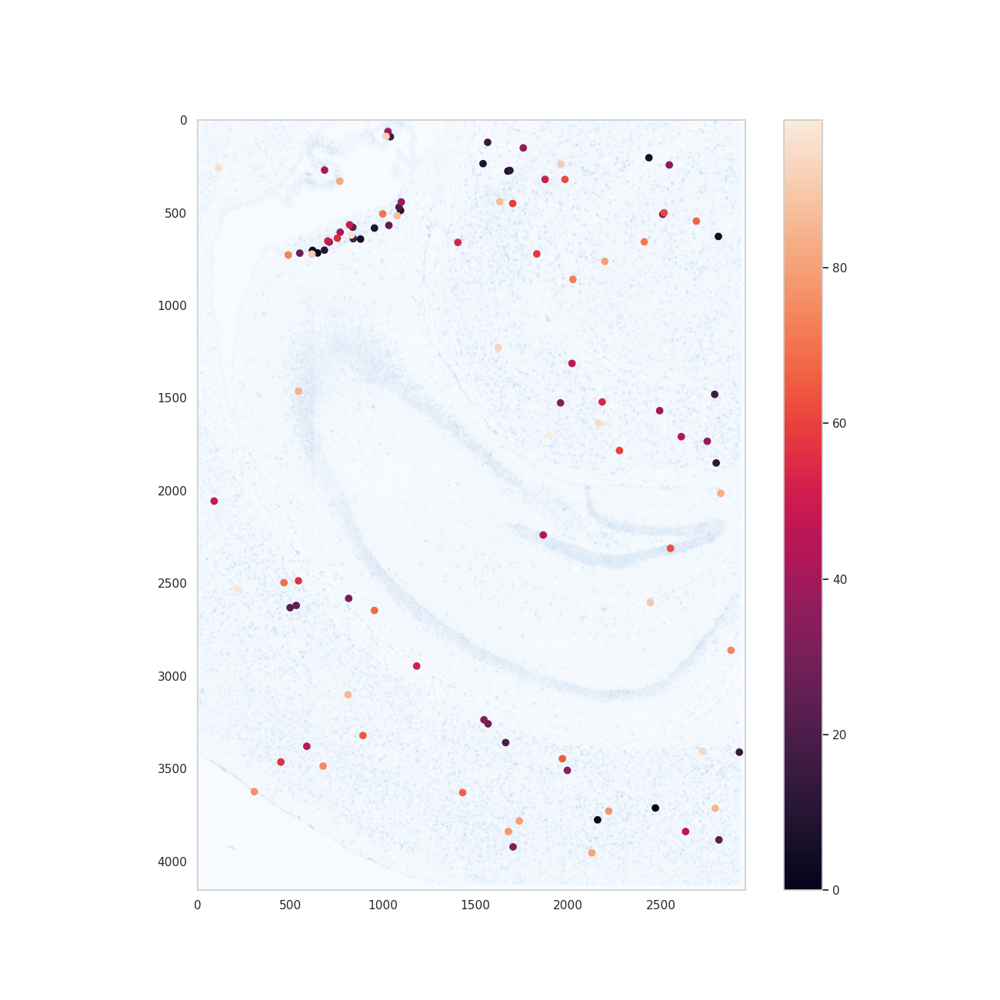

In [108]:
%matplotlib notebook

from scipy import ndimage

corrs_zoomed = ndimage.zoom(corrs,2.5,order=1).T
corrs_zoomed[corrs_zoomed<0]=0
corrs_zoomed[corrs_zoomed>1]=1

vf_norm_zoomed = ndimage.zoom(ds.vf_norm.sum(-1),2.5,order=1).T
vf_norm_zoomed/=vf_norm_zoomed.max()

plt.figure(figsize=(13,13))
# plt.imshow(ds.vf_norm.sum(-1).T>5,cmap='Blues')
# plt.imshow(1*(corrs_zoomed<0.3),cmap='Reds',alpha =0.4)



rois =(vf_norm_zoomed)/(corrs_zoomed+0.1)#&(corrs_zoomed<0.3)
plt.imshow(rois[10:,10:],cmap='Blues')
# plt.imshow(-corrs_zoomed[10:,10:],interpolation='none',alpha=0.6,cmap='Reds',vmax=1.2)
# plt.colorbar()

np.save('../../output/xenium_prerelease_jun20_mBrain_replicates/correlations_z_axis_rep_2.npy',corrs_zoomed)

# plt.xlim(*xlim)
# plt.ylim(*ylim)
# plt.scatter(adata.uns['spots']['x_location'][::10],adata.uns['spots']['y_location'][::10],marker='x',alpha=0.2)
# plt.scatter(df['x_location'][::3],df['y_location'][::3],marker='x',alpha=0.1)
# corrs.min()

In [109]:
result = ndimage.maximum_filter(rois, size=8)
# plt.figure()

localmaxs = np.where(((result==rois)&(rois>0.01)))
localmax_values = (rois[localmaxs])

localmax_indices = np.argsort(localmax_values)[::-1]

plt.scatter(localmaxs[1][localmax_indices[:100]],localmaxs[0][localmax_indices[:100]],c=range(100))
plt.colorbar()

In [110]:
xlims,ylims = plt.gca().get_xlim(),plt.gca().get_ylim()

df_subsample = adata.uns['spots'][(adata.uns['spots'].x_location>xlims[0])&(adata.uns['spots'].x_location<xlims[1])&(adata.uns['spots'].y_location<ylims[0])&(adata.uns['spots'].y_location>ylims[1])]
df_subsample=df_subsample[df_subsample.feature_name.isin(ds.genes)]



In [47]:
print(f"xlims,ylims=({xlims},{ylims})")

xlims,ylims=((-0.5, 2954.5),(4154.5, -0.5))


In [48]:
signatures = pd.read_csv("../../data/mBrain/mean_expression-20221009T190945Z-001/mean_expression/mean_expression_Yao_150kcells_42_subclass_label.csv",index_col=0)
signatures = signatures[ds.genes]


In [49]:
umap_df = pd.DataFrame(list((np.array(ds.local_maxs).T[ds.filtered_cluster_labels!=-1]).T)+[ds.cluster_labels.astype(int)[ds.filtered_cluster_labels!=-1]]+[d for d in umap_coords.T]).T
umap_df.columns = ['x','y','z','c','umap_0','umap_1']

umap_df.to_csv('umap_df.csv')
umap_df

,x,y,z,c,umap_0,umap_1
0,7.0,1139.0,6.0,18.0,-0.593298,-9.382697
1,7.0,1570.0,0.0,36.0,-0.389323,10.008102
2,8.0,394.0,0.0,14.0,-6.196071,-0.829330
3,8.0,1110.0,4.0,34.0,0.011468,-8.694029
4,8.0,1139.0,2.0,18.0,-0.736799,-9.233851
...,...,...,...,...,...,...
6405,1173.0,132.0,4.0,42.0,13.777271,-9.263591
6406,1173.0,216.0,4.0,4.0,3.582521,21.160389
6407,1173.0,965.0,4.0,4.0,1.086736,21.184961
6408,1173.0,1021.0,4.0,0.0,7.885050,-6.347083


In [50]:
centroids = pd.DataFrame(ds.centroids,columns=ds.genes)

xcorrs = []
for s in signatures.T:
    xcorrs.append(centroids.T.corrwith(signatures.T[s]))

xcorrs=pd.DataFrame((xcorrs),index=signatures.index)
maps = xcorrs.idxmax()
maps = maps.astype('category')


In [132]:
label_colors = maps.cat.codes[umap_df.c]



18     8
36    15
14    14
34     8
18     8
      ..
42     8
4      5
4      5
0      1
39     0
Length: 6410, dtype: int8

In [53]:
df_subsample[['cumap_0','cumap_1','cumap_2',]] = cle_umapped

df_norm = df_subsample.copy()

df_norm-=df_norm.mean()
df_norm/=df_norm.std()

df_norm['feature_name']=df_subsample.feature_name

df_norm

/tmp/ipykernel_1001542/3610496775.py:5: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  df_norm-=df_norm.mean()


,cell_id,overlaps_nucleus,feature_name,x_location,y_location,z_location,qv,cumap_0,cumap_1,cumap_2
transcript_id,,,,,,,,,,
281479271678353,0.662456,-1.031277,Bhlhe40,-0.834536,1.267140,-1.672227,0.837204,-0.791261,0.413966,0.242193
281479271678636,0.666447,0.969209,Sox10,0.083545,-0.117036,-1.611438,0.837204,-0.339568,0.198578,-2.134181
281479271678642,-1.516687,0.969209,Car4,1.528837,0.752983,-1.444990,0.837204,1.156947,1.452129,1.133279
281479271678979,-1.543028,-1.031277,Neurod6,1.895748,-1.166073,-1.047815,0.837204,-1.155225,0.545278,0.220156
281479271679367,0.649684,-1.031277,Sox10,-1.871630,-1.755420,-0.369861,0.100792,-0.593751,0.169815,-1.698666
...,...,...,...,...,...,...,...,...,...,...
281479272083415,-1.516687,0.969209,Meis2,0.799833,0.405564,1.243979,-1.708126,-0.523008,0.184738,0.300831
281479272083416,-1.516687,0.969209,Trpc4,1.241854,0.953909,1.463954,-1.603209,-0.548051,0.251042,0.308233
281479272083431,-1.516687,0.969209,Nell1,0.986861,0.610012,1.713138,0.837204,0.512548,-0.816511,0.663466


/home/tiesmeys/miniconda3/envs/spatial2022/lib/python3.9/site-packages/sklearn/neighbors/_classification.py:211: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
/home/tiesmeys/miniconda3/envs/spatial2022/lib/python3.9/site-packages/sklearn/neighbors/_classification.py:211: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and

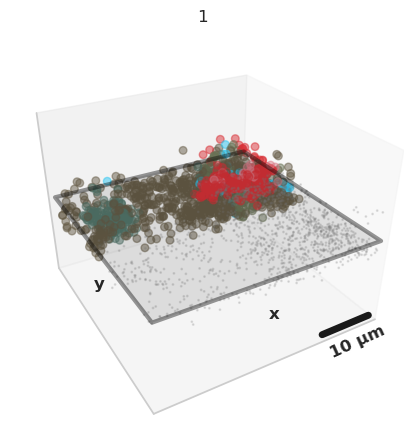

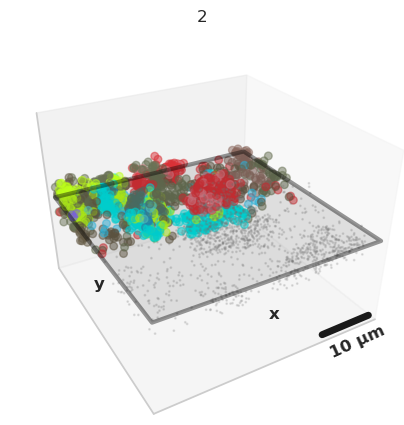

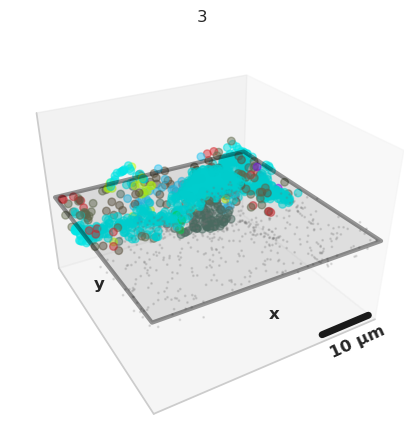

In [464]:
%matplotlib inline

# n_cases=(30)#[1,2,3,5,7,10,12]
# cases=[1,2,3,5,7,11,12,13,14,16,18,20,21,26,27]
# cases=[2,3,7]
cases=[2,3,5]

nt=0
for n in cases:
    
    i = localmax_indices[n]
    x_center,y_center = localmaxs[1][i]-10,localmaxs[0][i]-10
    xlims,ylims = (x_center-window_size,x_center+window_size),(y_center+window_size,y_center-window_size)
    df_subsample = adata.uns['spots'][(adata.uns['spots'].x_location>xlims[0])&(adata.uns['spots'].x_location<xlims[1])&(adata.uns['spots'].y_location<ylims[0])&(adata.uns['spots'].y_location>ylims[1])]
    df_subsample=df_subsample[df_subsample.feature_name.isin(ds.genes)]

    knn = NearestNeighbors(n_neighbors=30).fit(df_subsample[['x_location','y_location','z_location']])

    dists,nbrs=knn.kneighbors(df_subsample[['x_location','y_location','z_location']])
    gene_idcs = np.array([ds.genes.index(x)  for x in df_subsample.feature_name])

    local_expressions = np.zeros((len(df_subsample),ds.vf.shape[-1]))

    for i in range(len(df_subsample)):

        weighted_dists = 1/(np.pi*2*2.5**2)**0.5* np.exp(-(dists[i]/2.5)**2*0.5) 

        for j,w in enumerate(weighted_dists):
            local_expressions[i,gene_idcs[nbrs[i,j]]]+=w
            
    le_transformed = pca.transform(local_expressions)
    le_umapped = umap.transform(le_transformed)

    u_knn = KNeighborsClassifier(n_neighbors=10,).fit(umap_coords,umap_df.colors)
    cle_umapped = u_knn.predict(le_umapped,)
    
    

    fig = plt.figure(figsize=(5,5))


    ax=fig.add_subplot(111,projection='3d')
    ax.set_proj_type('persp', focal_length=0.3)


    ax.set_ylim(*xlims)
    ax.set_xlim(*ylims)
    ax.set_zlim(df_subsample.z_location.mean()-10,df_subsample.z_location.mean()+10)
    
    ax.view_init(elev=30., azim=60,)

    ax.set_yticks([x_center],[x_center])

#     ax.set_xlabel('x ')
#     ax.set_ylabel('y ')
#     ax.set_zlabel('z (μm)')

    surf = ax.plot_surface([[y_center+20]*2,[y_center-20]*2],[[x_center-20,x_center+20]]*2, np.array([[df_subsample.z_location.mean(),df_subsample.z_location.mean()]]*2) , 
                    linewidth=3,facecolors=[[(0.0,0.0,.0,0.1)]])
    surf.set_edgecolor((0.0,0.0,0.0,0.4,))
    
    ax.scatter(df_subsample[df_subsample.x_location<x_center].y_location[::],
               df_subsample[df_subsample.x_location<x_center].x_location[::],
               df_subsample[df_subsample.x_location<x_center].z_location[::],c=cle_umapped[df_subsample.x_location<x_center],s=30,alpha=0.5 )

    ax.scatter(df_subsample[df_subsample.x_location>x_center].y_location[::],
               df_subsample[df_subsample.x_location>x_center].x_location[::],
               df_subsample[df_subsample.x_location>x_center].z_location[::],s=1,alpha=0.2,color='Grey' )

    nt+=1
    plt.title(nt)
    
    
    ax.text(y_center,x_center+20,df_subsample.z_location.mean()-5,'x',fontweight='bold',ha='center')
    ax.text(y_center-20,x_center,df_subsample.z_location.mean()-5,'y',fontweight='bold',ha='center')
    
    ax.plot([y_center+window_size,y_center+window_size-10],[x_center+window_size,x_center+window_size],[df_subsample.z_location.mean()-10,df_subsample.z_location.mean()-10],color='k',linewidth=5)
    ax.text(y_center+window_size-1,x_center+window_size,df_subsample.z_location.mean()-16,'10 μm',zdir='x',fontweight='bold',ha='center')

    
#     plt.tight_layout()

    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_zticks([])
    
    
    plt.savefig(f'edge-case-{nt}.pdf',dpi=300)
    
    

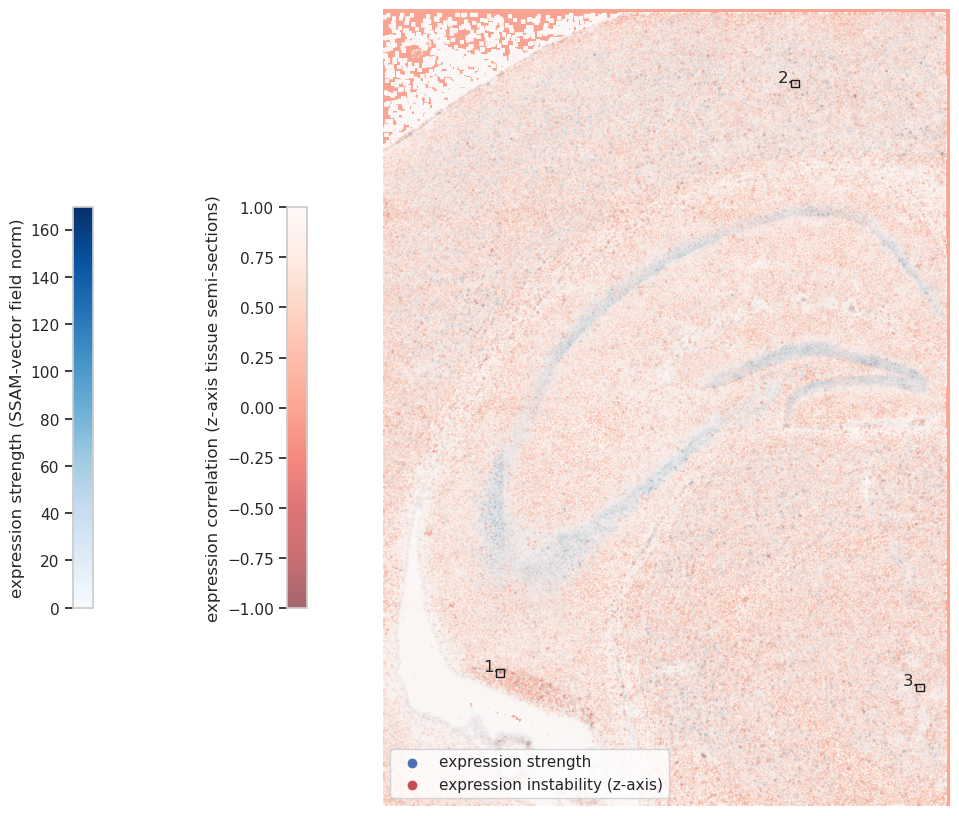

In [465]:
# %matplotlib notebook

from scipy import ndimage

corrs_zoomed = ndimage.zoom(corrs,2.5,order=1).T
corrs_zoomed[corrs_zoomed<-1]=-1
corrs_zoomed[corrs_zoomed>1]=1

plt.figure(figsize=(13,13))
# plt.imshow(ds.vf_norm.sum(-1).T>5,cmap='Blues')
# plt.imshow(1*(corrs_zoomed<0.3),cmap='Reds',alpha =0.4)

# cases=range(30)

for ic,n in enumerate(cases):
    i = localmax_indices[n]
    x_center,y_center = localmaxs[1][i]-10,localmaxs[0][i]-10
    xlims,ylims = (x_center-window_size,x_center+window_size),(y_center+window_size,y_center-window_size)

    plt.text(x_center-90,y_center+10,str(ic+1)+'.')
    plt.gca().add_patch(plt.Rectangle((xlims[0],ylims[0]),xlims[1]-xlims[0],ylims[1]-ylims[0],edgecolor='k',facecolor=(0,0,0,0)))

#     plt.scatter([x_center],[y_center],color='k',marker='x')

rois = (ndimage.zoom(ds.vf_norm.sum(-1),2.5,order=1).T>5)&(corrs_zoomed<0.3)
imh1=plt.imshow(ndimage.zoom(ds.vf_norm.sum(-1).T,2.5,order=1)[10:-10,10:-10],cmap='Blues')
imh2=plt.imshow(corrs_zoomed[10:,10:],interpolation='none',alpha=0.6,cmap='Reds_r',vmin=-1,vmax=1)

cb1=plt.colorbar(imh1,shrink=0.4,location='left')
cb2=plt.colorbar(imh2,shrink=0.4,location='left')
cb2.set_label('expression correlation (z-axis tissue semi-sections)')
cb1.set_label('expression strength (SSAM-vector field norm)')

plt.legend([plt.scatter([],[],color=c) for c in ['b','r']],('expression strength','expression instability (z-axis)'),loc='lower left')

np.save('../../output/xenium_prerelease_jun20_mBrain_replicates/correlations_z_axis_rep_2.npy',corrs_zoomed)
plt.savefig('signal_coherence.svg',dpi=300)

plt.axis('off')

plt.gca().invert_yaxis()

/home/tiesmeys/miniconda3/envs/spatial2022/lib/python3.9/site-packages/sklearn/neighbors/_classification.py:211: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
/home/tiesmeys/miniconda3/envs/spatial2022/lib/python3.9/site-packages/sklearn/neighbors/_classification.py:211: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and

/home/tiesmeys/miniconda3/envs/spatial2022/lib/python3.9/site-packages/sklearn/neighbors/_classification.py:211: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
/home/tiesmeys/miniconda3/envs/spatial2022/lib/python3.9/site-packages/sklearn/neighbors/_classification.py:211: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and

/home/tiesmeys/miniconda3/envs/spatial2022/lib/python3.9/site-packages/sklearn/neighbors/_classification.py:211: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)


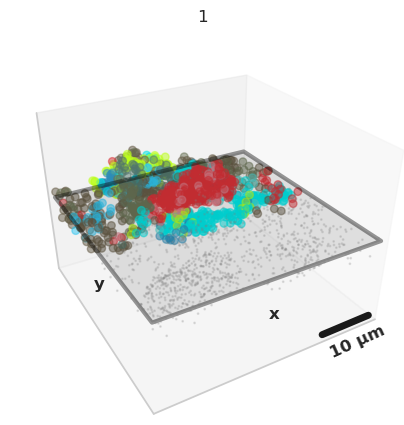

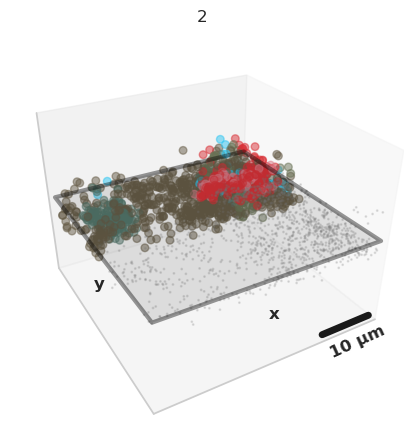

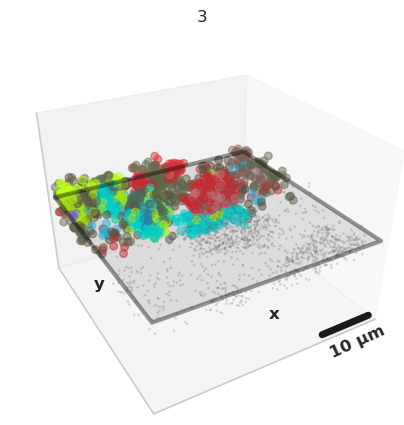

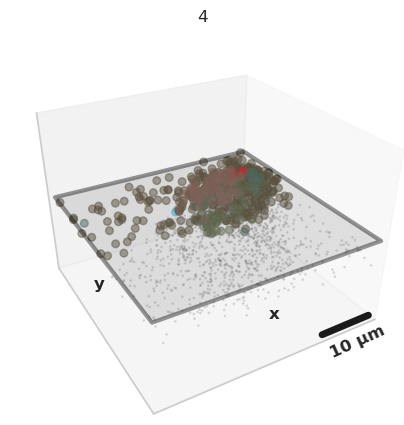

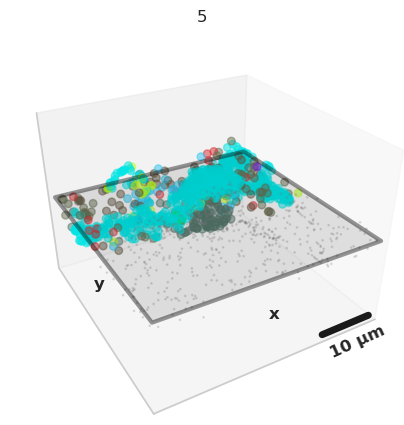

...

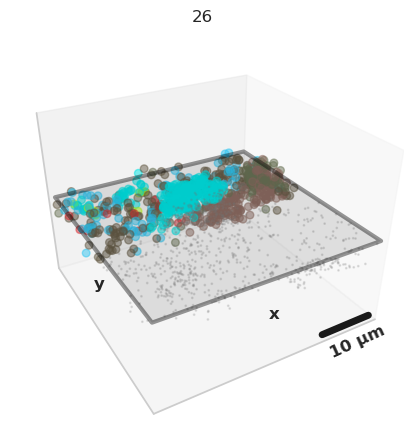

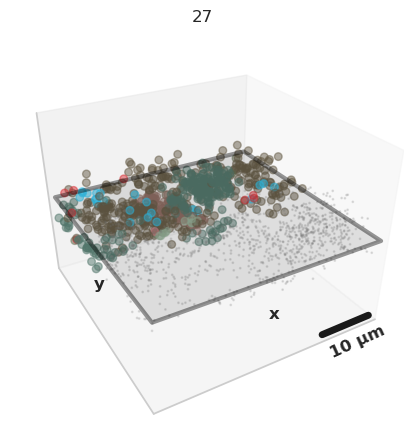

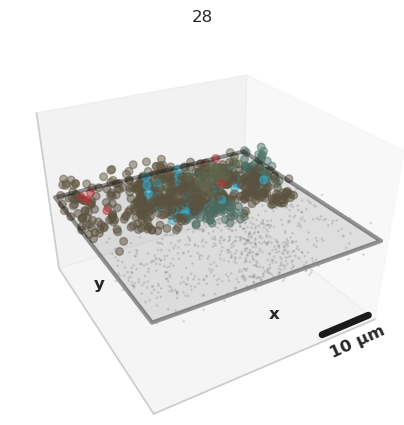

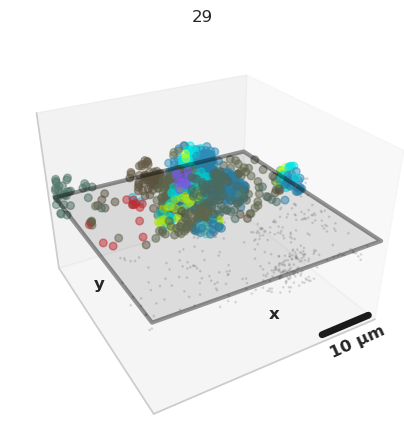

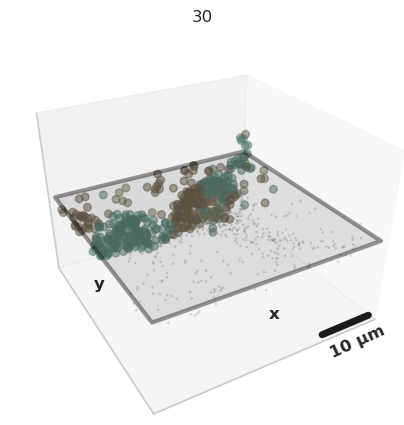

In [459]:
%matplotlib inline

# n_cases=(30)#[1,2,3,5,7,10,12]
# cases=[1,2,3,5,7,11,12,13,14,16,18,20,21,26,27]
# cases=[2,3,7]
# cases=[2,3,8]
cases=range(30)
nt=0
for n in cases:
    
    i = localmax_indices[n+1]
    x_center,y_center = localmaxs[1][i]-10,localmaxs[0][i]-10
    xlims,ylims = (x_center-window_size,x_center+window_size),(y_center+window_size,y_center-window_size)
    df_subsample = adata.uns['spots'][(adata.uns['spots'].x_location>xlims[0])&(adata.uns['spots'].x_location<xlims[1])&(adata.uns['spots'].y_location<ylims[0])&(adata.uns['spots'].y_location>ylims[1])]
    df_subsample=df_subsample[df_subsample.feature_name.isin(ds.genes)]

    knn = NearestNeighbors(n_neighbors=30).fit(df_subsample[['x_location','y_location','z_location']])

    dists,nbrs=knn.kneighbors(df_subsample[['x_location','y_location','z_location']])
    gene_idcs = np.array([ds.genes.index(x)  for x in df_subsample.feature_name])

    local_expressions = np.zeros((len(df_subsample),ds.vf.shape[-1]))

    for i in range(len(df_subsample)):

        weighted_dists = 1/(np.pi*2*2.5**2)**0.5* np.exp(-(dists[i]/2.5)**2*0.5) 

        for j,w in enumerate(weighted_dists):
            local_expressions[i,gene_idcs[nbrs[i,j]]]+=w
            
    le_transformed = pca.transform(local_expressions)
    le_umapped = umap.transform(le_transformed)

    u_knn = KNeighborsClassifier(n_neighbors=10,).fit(umap_coords,umap_df.colors)
    cle_umapped = u_knn.predict(le_umapped,)
    
    

    fig = plt.figure(figsize=(5,5))


    ax=fig.add_subplot(111,projection='3d')
    ax.set_proj_type('persp', focal_length=0.3)


    ax.set_ylim(*xlims)
    ax.set_xlim(*ylims)
    ax.set_zlim(df_subsample.z_location.mean()-10,df_subsample.z_location.mean()+10)
    
    ax.view_init(elev=30., azim=60,)

    ax.set_yticks([x_center],[x_center])

#     ax.set_xlabel('x ')
#     ax.set_ylabel('y ')
#     ax.set_zlabel('z (μm)')

    surf = ax.plot_surface([[y_center+20]*2,[y_center-20]*2],[[x_center-20,x_center+20]]*2, np.array([[df_subsample.z_location.mean(),df_subsample.z_location.mean()]]*2) , 
                    linewidth=3,facecolors=[[(0.0,0.0,.0,0.1)]])
    surf.set_edgecolor((0.0,0.0,0.0,0.4,))
    
    ax.scatter(df_subsample[df_subsample.x_location<x_center].y_location[::],
               df_subsample[df_subsample.x_location<x_center].x_location[::],
               df_subsample[df_subsample.x_location<x_center].z_location[::],c=cle_umapped[df_subsample.x_location<x_center],s=30,alpha=0.5 )

    ax.scatter(df_subsample[df_subsample.x_location>x_center].y_location[::],
               df_subsample[df_subsample.x_location>x_center].x_location[::],
               df_subsample[df_subsample.x_location>x_center].z_location[::],s=1,alpha=0.2,color='Grey' )

    nt+=1
    plt.title(nt)
    
    
    ax.text(y_center,x_center+20,df_subsample.z_location.mean()-5,'x',fontweight='bold',ha='center')
    ax.text(y_center-20,x_center,df_subsample.z_location.mean()-5,'y',fontweight='bold',ha='center')
    
    ax.plot([y_center+window_size,y_center+window_size-10],[x_center+window_size,x_center+window_size],[df_subsample.z_location.mean()-10,df_subsample.z_location.mean()-10],color='k',linewidth=5)
    ax.text(y_center+window_size-1,x_center+window_size,df_subsample.z_location.mean()-16,'10 μm',zdir='x',fontweight='bold',ha='center')

    
#     plt.tight_layout()

    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_zticks([])
    
    
    plt.savefig(f'edge-case-{nt}.pdf',dpi=300)
    
    

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
/tmp/ipykernel_1001542/2370079901.py:68: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  df_norm-=df_norm.mean()


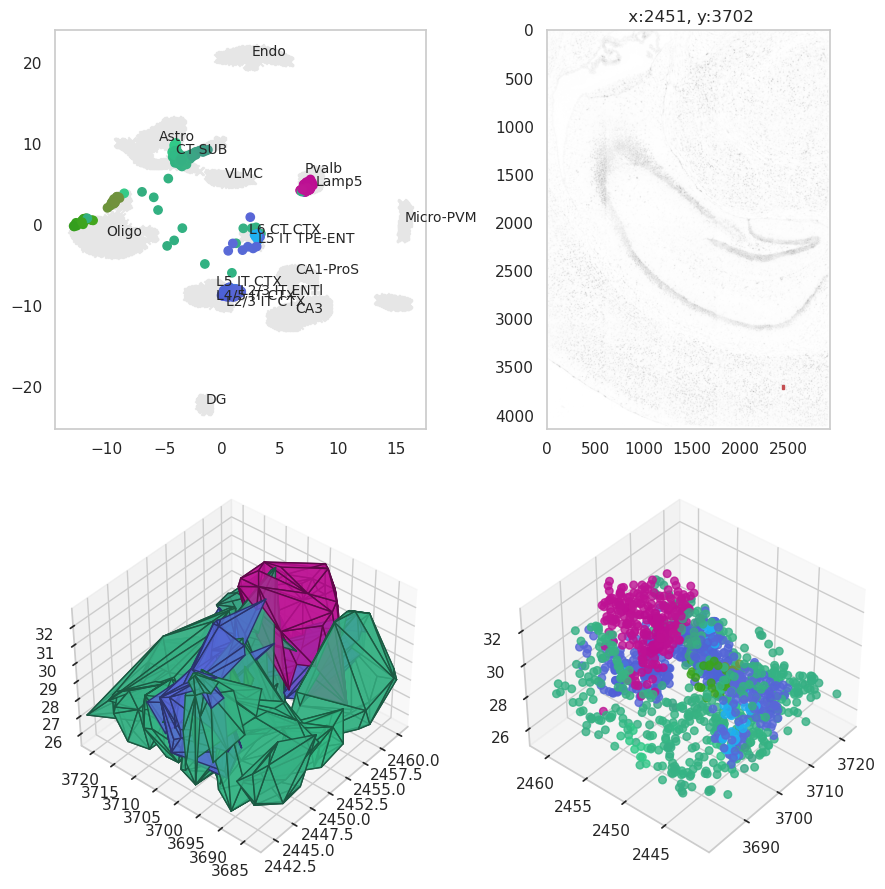

In [ ]:
%matplotlib inline
from scipy.spatial import ConvexHull
from sklearn.cluster import MeanShift as CL
import mpl_toolkits.mplot3d as a3

window_size=20

n_cases=1

for n in range(n_cases):
    i = localmax_indices[n+1]
    x_center,y_center = localmaxs[1][i]-10,localmaxs[0][i]-10
    xlims,ylims = (x_center-window_size,x_center),(y_center+window_size,y_center-window_size)
    df_subsample = adata.uns['spots'][(adata.uns['spots'].x_location>xlims[0])&(adata.uns['spots'].x_location<xlims[1])&(adata.uns['spots'].y_location<ylims[0])&(adata.uns['spots'].y_location>ylims[1])]
    df_subsample=df_subsample[df_subsample.feature_name.isin(ds.genes)]

    knn = NearestNeighbors(n_neighbors=30).fit(df_subsample[['x_location','y_location','z_location']])

    dists,nbrs=knn.kneighbors(df_subsample[['x_location','y_location','z_location']])
    gene_idcs = np.array([ds.genes.index(x)  for x in df_subsample.feature_name])

    local_expressions = np.zeros((len(df_subsample),ds.vf.shape[-1]))

    for i in range(len(df_subsample)):

        weighted_dists = 1/(np.pi*2*2.5**2)**0.5* np.exp(-(dists[i]/2.5)**2*0.5) 

        for j,w in enumerate(weighted_dists):
            local_expressions[i,gene_idcs[nbrs[i,j]]]+=w
            
    le_transformed = pca.transform(local_expressions)
    le_umapped = umap.transform(le_transformed)

    cle_umapped = cumap.transform(le_transformed)
    
    cle_umapped-=cumap_coords.min(0)
    cle_umapped/=cumap_coords.max(0)

    cle_umapped[cle_umapped<0]=0
    cle_umapped[cle_umapped>1]=1
    
    fig = plt.figure(figsize=(9,9))
    plt.subplot(221)

    azim = 220

    plt.scatter(*umap_coords.T,marker='x',c=(0.9,0.9,0.9),)#=ds.cluster_labels[ds.filtered_cluster_labels != -1],cmap='nipy_spectral',alpha=1)
    plt.scatter(*le_umapped.T,c=cle_umapped)
    for i,label in enumerate(maps.cat.categories):

        clusters = maps[maps==label].index
        df_subset = umap_df[umap_df.c.isin(clusters.values)].median()
        plt.text(x=df_subset['umap_0'],y=df_subset['umap_1'],s=label,size=10)

    ax=plt.subplot(222)
    plt.title(f" x:{int(np.mean(xlims))}, y:{int(np.mean(ylims))}")
    plt.imshow(ndimage.zoom(ds.vf_norm.sum(-1)[10:,10:].T,2.5,order=1),cmap='Greys',alpha=0.5)
    ax.add_patch(plt.Rectangle((xlims[0],ylims[0]),xlims[1]-xlims[0],ylims[1]-ylims[0],color='r'))

    ax=fig.add_subplot(223,projection='3d')
    ax2=fig.add_subplot(224,projection='3d')


    df_subsample[['cumap_0','cumap_1','cumap_2',]] = cle_umapped

    df_norm = df_subsample.copy()

    df_norm-=df_norm.mean()
    df_norm[['cumap_0','cumap_1','cumap_2',]]*=(df_subsample[['x_location','y_location','z_location']]).to_numpy().std()/2
#     df_norm/=df_norm.std()

    df_norm['feature_name']=df_subsample.feature_name


    ms = CL(bandwidth=8).fit(df_norm[['x_location','y_location','z_location','cumap_0','cumap_1','cumap_2']])


    ms_labels = np.array(ms.labels_)

    for c in set(ms.labels_):

        if (ms_labels==c).sum()>3:
            hull=ConvexHull(df_subsample[ms_labels==c][['x_location','y_location','z_location']])

            for i,s in enumerate(hull.simplices):

                coords = df_subsample[ms_labels==c].iloc[s][['x_location','y_location','z_location']]

                sq=coords.to_numpy()
                
                color=cle_umapped[ms_labels==c].mean(0)

                f = a3.art3d.Poly3DCollection([sq])
                f.set_color(color)
                f.set_edgecolor(color/2)
                f.set_alpha(0.8)
                ax.add_collection3d(f)
                

    ax.set_xlim(df_subsample.x_location.min(),df_subsample.x_location.max())
    ax.set_zlim(df_subsample.z_location.min(),df_subsample.z_location.max())
    ax.set_ylim(df_subsample.y_location.min(),df_subsample.y_location.max())
    ax.view_init(elev=40., azim=azim)
    ax2.view_init(elev=40., azim=azim)


    ax2.scatter(df_subsample.y_location[::],df_subsample.x_location[::],df_subsample.z_location[::],c=cle_umapped,s=30,alpha=0.8 )

#     ax2.view_init(elev=-40., azim=azim)
#     ax2.set_xlim(df_subsample.x_location.min(),df_subsample.x_location.max())
#     ax2.set_zlim(df_subsample.z_location.min(),df_subsample.z_location.max())
#     ax2.set_ylim(df_subsample.y_location.min(),df_subsample.y_location.max())

    plt.tight_layout()